 # Covid-19 and Pnemonia Prediction with Convolutional Neural Network
 ## Project by Salik Sayyed
 ### Here we will train models to predict Covid-19 and Pnemonia and along with training answering one question of X-ray footprint relation between Covid-19 and Pnemonia.

In [45]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import tensorflow as tf
import numpy as np
import keras
from keras import backend as K
from keras.models import Sequential
from keras.layers import Activation
from keras.layers.core import Dense, Flatten
from keras.optimizers import Adam
from keras.metrics import categorical_crossentropy
from keras.preprocessing.image import ImageDataGenerator
from keras.layers.normalization import BatchNormalization
from keras.layers.convolutional import *
from matplotlib import pyplot as plt
from sklearn.metrics import confusion_matrix
import itertools
import matplotlib.pyplot as plt
import seaborn as sns



train_path='/content/xray_dataset_covid19/train/'
test_path='/content/xray_dataset_covid19/test/'

train_batches =ImageDataGenerator().flow_from_directory(train_path,target_size=(224,224),classes=['COVID','NORMAL'],batch_size=10)
test_batches=ImageDataGenerator().flow_from_directory(test_path,target_size=(224,224),classes=['COVID','NORMAL'],batch_size=10)

images,labels=next(train_batches)



Found 74 images belonging to 2 classes.
Found 20 images belonging to 2 classes.


### Importing VGG16 model for further changes

In [3]:
def down_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    c = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(x)
    c = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(c)
    p = keras.layers.MaxPool2D((2, 2), (2, 2))(c)
    return c, p

def up_block(x, skip, filters, kernel_size=(3, 3), padding="same", strides=1):
    us = keras.layers.UpSampling2D((2, 2))(x)
    concat = keras.layers.Concatenate()([us, skip])
    c = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(concat)
    c = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(c)
    return c

def bottleneck(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    c = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(x)
    c = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(c)
    return c

In [4]:
image_size= 224
def UNet():
    f = [16, 32, 64, 128, 256]
    inputs = keras.layers.Input((image_size, image_size, 3))
    
    p0 = inputs
    c1, p1 = down_block(p0, f[0]) #128 -> 64
    c2, p2 = down_block(p1, f[1]) #64 -> 32
    c3, p3 = down_block(p2, f[2]) #32 -> 16
    c4, p4 = down_block(p3, f[3]) #16->8
    
    bn = bottleneck(p4, f[4])
    
    u1 = up_block(bn, c4, f[3]) #8 -> 16
    u2 = up_block(u1, c3, f[2]) #16 -> 32
    u3 = up_block(u2, c2, f[1]) #32 -> 64
    u4 = up_block(u3, c1, f[0]) #64 -> 128
    
    outputs = keras.layers.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(u4)
    model = keras.models.Model(inputs, outputs)
    return model

In [5]:
unetmodel=UNet()

In [6]:
unetmodel.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 224, 224, 16) 448         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 224, 224, 16) 2320        conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 112, 112, 16) 0           conv2d_1[0][0]                   
_______________________________________________________________________________________

In [7]:
from tensorflow.keras import layers
from tensorflow.keras import Model
last_layer = unetmodel.layers[-1]
x = tf.keras.layers.Flatten()(last_layer.output)
x = tf.keras.layers.Dense(500,activation="relu")(x)
x = tf.keras.layers.Dense(1,activation="sigmoid")(x)
newmodelunet=Model(unetmodel.input,x)

**DATASET 1st**

In [17]:
train_path='/content/chest_xray/train/'
test_path='/content/chest_xray/test/'
val_path='/content/chest_xray/val/'

train_batches =ImageDataGenerator().flow_from_directory(train_path,target_size=(224,224),class_mode='binary',batch_size=100)
test_batches=ImageDataGenerator().flow_from_directory(test_path,target_size=(224,224),class_mode='binary',batch_size=50)
val_bathes=ImageDataGenerator().flow_from_directory(val_path,target_size=(224,224),class_mode='binary',batch_size=4)
print(val_bathes)
values_batch=val_bathes
images,labels=next(train_batches)

Found 5216 images belonging to 2 classes.
Found 624 images belonging to 2 classes.
Found 16 images belonging to 2 classes.


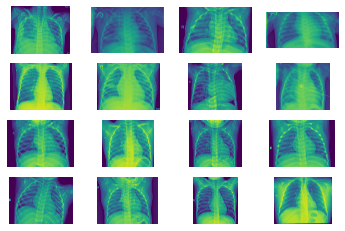

In [39]:
fig = plt.gcf()
ncols=4
nrows=4
train_dir=os.path.join('/content/chest_xray/train/')
train_covid_dir = os.path.join(train_dir, 'PNEUMONIA')
train_normal_dir = os.path.join(train_dir, 'NORMAL')
train_covid_fnames = os.listdir( train_covid_dir )
train_normal_fnames = os.listdir( train_normal_dir )

fig.set_size_inches(ncols*4, nrows*4)
pic_index=0
pic_index+=8
%matplotlib inline

import matplotlib.image as mpimg

next_covid_pix = [os.path.join(train_covid_dir, fname) 
                for fname in train_covid_fnames[ pic_index-8:pic_index] 
               ]

next_normal_pix = [os.path.join(train_normal_dir, fname) 
                for fname in train_normal_fnames[ pic_index-8:pic_index]
               ]

for i, img_path in enumerate(next_covid_pix+next_normal_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()


In [18]:
newmodelunet.summary()
device_name=tf.test.gpu_device_name()

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 224, 224, 16) 448         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 224, 224, 16) 2320        conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 112, 112, 16) 0           conv2d_1[0][0]                   
_______________________________________________________________________________________

In [19]:
densenett = keras.applications.DenseNet169(input_shape=(224,224,3),include_top=False,classes=2,weights=None)

In [20]:
densenett.trainable=True

In [21]:
last_layer = densenett.layers[-1]
x = tf.keras.layers.Flatten()(last_layer.output)
x = tf.keras.layers.Dense(500,activation="relu")(x)
x = tf.keras.layers.Dense(1,activation="sigmoid")(x)
newmodel=Model(densenett.input,x)

In [22]:
newmodelunet.compile(Adam(lr=.0001),loss='binary_crossentropy',metrics=['accuracy'])

In [23]:
class Callc(tf.keras.callbacks.Callback):
    def on_epoch_end(self,epoch,logs={}):
        if(logs.get('val_accuracy')>0.85 and logs.get('accuracy')>0.99):
            print("Model Trained till desired limit!")
            self.model.stop_training = True
callbacks = Callc()

In [24]:
history = newmodelunet.fit_generator(train_batches,validation_data=values_batch,validation_steps=4,steps_per_epoch=53,epochs=20,callbacks= [callbacks])

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/20
53/53 [==============================] - 79s 1s/step - loss: 1.4363 - accuracy: 0.7228 - val_loss: 0.6644 - val_accuracy: 0.6875
Epoch 2/20
53/53 [==============================] - 78s 1s/step - loss: 0.3174 - accuracy: 0.8608 - val_loss: 0.4915 - val_accuracy: 0.8125
Epoch 3/20
53/53 [==============================] - 78s 1s/step - loss: 0.1689 - accuracy: 0.9329 - val_loss: 0.2893 - val_accuracy: 0.8750
Epoch 4/20
53/53 [==============================] - 79s 1s/step - loss: 0.0789 - accuracy: 0.9689 - val_loss: 0.2181 - val_accuracy: 0.9375
Epoch 5/20
53/53 [==============================] - 78s 1s/step - loss: 0.0538 - accuracy: 0.9799 - val_loss: 0.3599 - val_accuracy: 0.8125
Epoch 6/20
53/53 [==============================] - 77s 1s/step - loss: 0.0270 - accuracy: 0.9923 - val_loss: 0.3400 - val_accuracy: 0.8125
Epoch 7/20
53/53 [==============================] - 77s 1s/step - loss: 0.0213 - acc

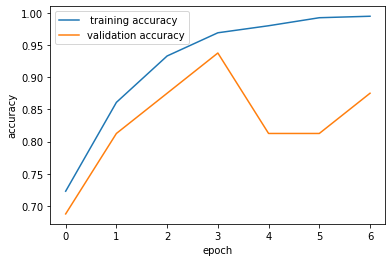

In [25]:
import matplotlib.pyplot as plt
x_data=list(range(len(history.history['accuracy'])))
plt.plot(x_data,history.history['accuracy'],label=" training accuracy")
plt.plot(x_data,history.history['val_accuracy'],label="validation accuracy")
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend()
plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


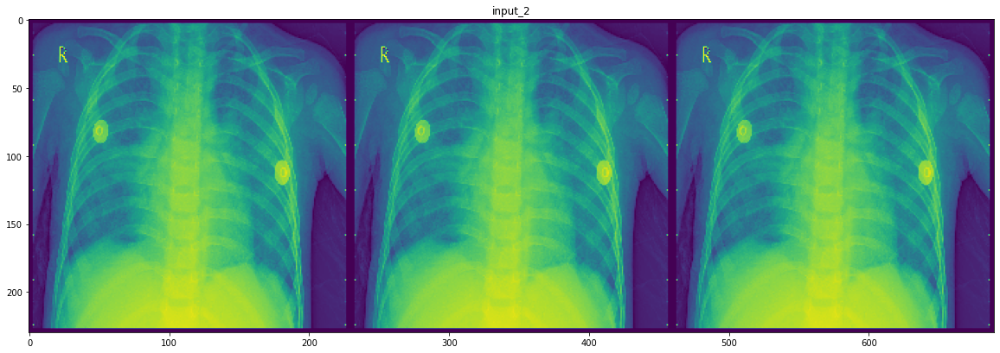

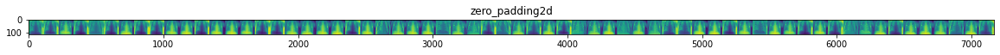

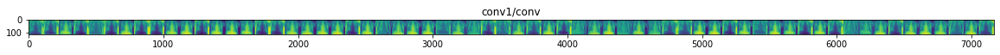

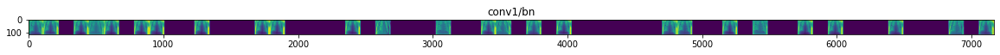

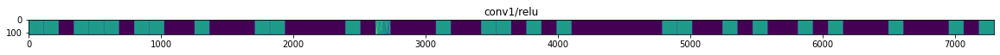

...

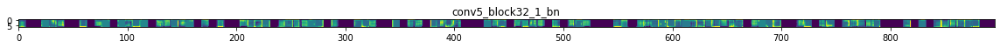

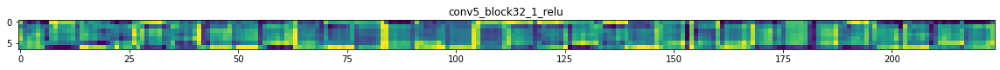

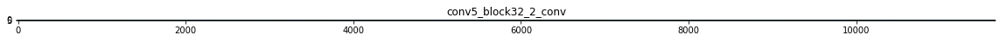

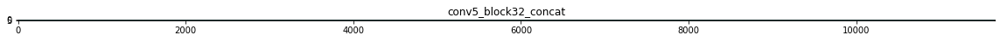

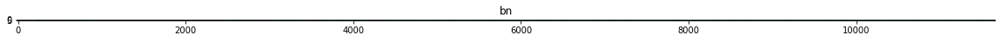

In [44]:
import numpy as np
import random
from   tensorflow.keras.preprocessing.image import img_to_array, load_img


successive_outputs = [layer.output for layer in newmodel2.layers[1:]]


visualization_model = tf.keras.models.Model(inputs = newmodel2.input, outputs = successive_outputs)

# Let's prepare a random input image of a cat or dog from the training set.
covid_img_files = [os.path.join(train_covid_dir, f) for f in train_covid_fnames]
normal_img_files = [os.path.join(train_normal_dir, f) for f in train_normal_fnames]

img_path = random.choice(covid_img_files + normal_img_files)
img = load_img(img_path, target_size=(224, 224))  # this is a PIL image

x   = img_to_array(img)                           # Numpy array with shape (150, 150, 3)
x   = x.reshape((1,) + x.shape)                   # Numpy array with shape (1, 150, 150, 3)

# Rescale by 1/255
x /= 255.0

# Let's run our image through our network, thus obtaining all
# intermediate representations for this image.
successive_feature_maps = visualization_model.predict(x)

# These are the names of the layers, so can have them as part of our plot
layer_names = [layer.name for layer in newmodel2.layers]

# -----------------------------------------------------------------------
# Now let's display our representations
# -----------------------------------------------------------------------
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  
  if len(feature_map.shape) == 4:
    
    n_features = feature_map.shape[-1] 
    size       = feature_map.shape[ 1]  
    
   
    display_grid = np.zeros((size, size * n_features))
    
    
    for i in range(n_features):
      x  = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std ()
      x *=  64
      x += 128
      x  = np.clip(x, 0, 255).astype('uint8')
      display_grid[:, i * size : (i + 1) * size] = x 

    scale = 20. / n_features
    plt.figure( figsize=(scale * n_features, scale) )
    plt.title ( layer_name )
    plt.grid  ( False )
    plt.imshow( display_grid, aspect='auto', cmap='viridis' ) 

**saving in file later to be downloaded**

In [26]:
newmodel.save('covid_trained_model_final.h5')

In [28]:
train_path2='/content/xray_dataset_covid19/train/'
test_path2='/content/xray_dataset_covid19/test/'


train_batches2 =ImageDataGenerator().flow_from_directory(train_path2,target_size=(224,224),class_mode='binary',batch_size=10)
test_batches2=ImageDataGenerator().flow_from_directory(test_path2,target_size=(224,224),class_mode='binary',batch_size=10)

Found 148 images belonging to 2 classes.
Found 40 images belonging to 2 classes.


In [29]:
newmodel2=newmodel

In [30]:
newmodel2.compile(Adam(lr=.00001),loss='binary_crossentropy',metrics=['accuracy'])

In [31]:
class Callcn(tf.keras.callbacks.Callback):
    def on_epoch_end(self,epoch,logs={}):
        if(logs.get('accuracy')>0.99):
            print("Model Trained till desired limit!")
            self.model.stop_training = True
callbacks1 = Callcn()

In [32]:
history2=newmodel2.fit_generator(train_batches2,steps_per_epoch=15,epochs=3,callbacks=[callbacks1])

Epoch 1/3
15/15 [==============================] - 10s 641ms/step - loss: 0.3058 - accuracy: 0.8784
Epoch 2/3
15/15 [==============================] - 6s 428ms/step - loss: 0.0736 - accuracy: 0.9595
Epoch 3/3
15/15 [==============================] - 7s 442ms/step - loss: 0.0393 - accuracy: 0.9865


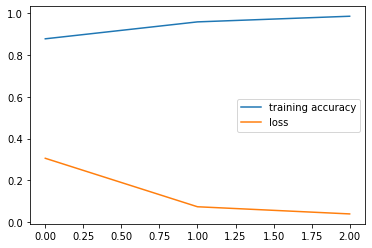

In [33]:
import matplotlib.pyplot as plt
plt.plot(list(range(len(history2.history['accuracy']))),history2.history['accuracy'],label="training accuracy")
plt.plot(list(range(len(history2.history['loss']))),history2.history['loss'],label="loss")
plt.legend()
plt.show()

In [34]:
newmodel2.save('new.h5')

In [35]:
file=os.stat('new.h5')
print(file)

os.stat_result(st_mode=33188, st_ino=3822155, st_dev=50, st_nlink=1, st_uid=0, st_gid=0, st_size=642522536, st_atime=1601547280, st_mtime=1601547284, st_ctime=1601547284)


In [ ]:
import os
os.chdir(r'/kaggle/working')
from IPython.display import FileLink
FileLink(r'new.h5')

/kaggle/working/new.h5

In [ ]:
from keras.preprocessing import image

import numpy as np
import os
allnormalcases=[]
covidinnormalcases=[]
allcovidcases=[]
covidincovidcases=[]

def load_image(img_path, show=False):

    img = image.load_img(img_path, target_size=(224,224))
    img_tensor = image.img_to_array(img)                    # (height, width, channels)
    img_tensor = np.expand_dims(img_tensor, axis=0)         # (1, height, width, channels), add a dimension because the model expects this shape: (batch_size, height, width, channels)
                               # imshow expects values in the range [0, 1]

    
    return img_tensor

pnemoniadetected = [] 
allcoviddetected = [] 
allpnemoniadetected = [] 
coviddetected = []
if __name__ == "__main__":

   
    dir_path = '/content/xray_dataset_covid19/test/NORMAL/'   
    dir_path2='/content/xray_dataset_covid19/test/PNEUMONIA/'# dog
    imgs= os.listdir(dir_path)
    
    img_path2 = '/kaggle/input/random/images.jpg'
    imgs2=os.listdir(dir_path2)
    print("IN ---------->"+dir_path)
   
    pn_n=0
    nn_n=0
    for i in imgs:
        new_image = load_image(dir_path+i)
        pred=newmodel2.predict(new_image)
        
        if(pred[0][0]>pred[0][1]):
            print("COVID UPTO :",pred[0][0])
            covidinnormalcases.append(pred[0],[0])
            pn_n+=1
        else:
            print("NORMAL UPTO : ",pred[0][1])
            allnormalcases.append(pred[0][1])
            nn_n+=1
    print("Accuracy in prediction of normal cases from all normal cases:",nn_n/(pn_n+nn_n)*100)
    nn_p=0
    pn_p=0
    print("IN ---------->"+dir_path2)
    for i in imgs2:
        new_image = load_image(dir_path2+i)
        pred=newmodel2.predict(new_image)
        
        if(pred[0][0]>pred[0][1]):
            print("COVID UPTO :",pred[0][0])
            covidincovidcases.append(pred[0][0])
            pn_p+=1
        else:
            print("NORMAL UPTO : ",pred[0][1])
            allcovidcases.append(pred[0][1])
            nn_p+=1
    print("Accuracy in Prediction from All covid cases :",pn_p/(pn_p+nn_p)*100)
    print("Overall accuracy of covid out of predicted covid:-->>",(pn_p)/(pn_p+pn_n)*100)

[0.99974686, 0.85637265, 0.9356872, 0.98938423, 0.6270642, 0.958508, 0.99407417, 0.71173096, 0.9979596, 0.9404524, 0.99007684, 0.97994506, 0.99306184, 0.99777347, 0.8471994, 0.9960483, 0.9791173, 0.88805073, 0.8226056, 0.7821271]


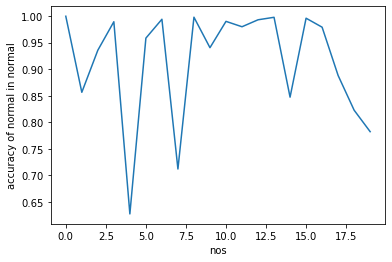

In [ ]:
print(allnormalcases)
plt.plot(allnormalcases)
plt.ylabel("accuracy of normal in normal")
plt.xlabel("nos")
plt.show()

### As you can see all the normal cases are predicted to be normal, but the accuracy does decrease below 60% which shows Covid prediction can be false positive

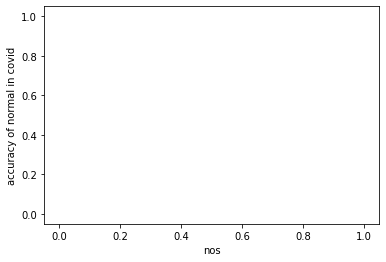

In [ ]:
print(allcovidcases)
plt.plot(allcovidcases)
plt.ylabel("accuracy of normal in covid")
plt.xlabel("nos")
plt.show()

### There are no prediction of Normal patient as Covid 

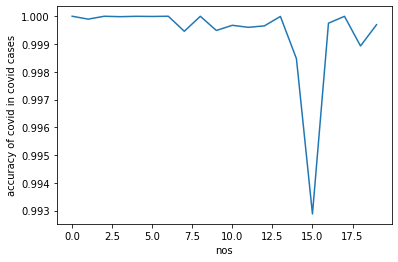

In [ ]:
plt.plot(covidincovidcases)
plt.ylabel("accuracy of covid in covid cases")
plt.xlabel("nos")
plt.show()

### Now when it comes to predicting Covid Cases from all Covid Cases model seems to work pretty well as all accuracies are above 0.993
### No case of Covid is left behind

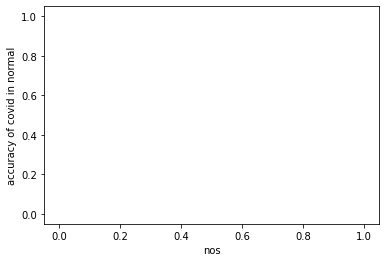

In [ ]:
plt.plot(covidinnormalcases)
plt.plot(emp)
plt.ylabel("accuracy of covid in normal")
plt.xlabel("nos")
plt.show()

### Theres no prediction of Covid in Normal however in previous graph of accuracies for normal patients as normal
### we say accuracy decreased so False positive is a possibility

In [ ]:
test_loss, test_acc = newmodel2.evaluate(test_batches2)
print(test_loss,test_acc)

4/4 [==============================] - 3s 690ms/step
0.15482132136821747 0.9750000238418579


In [ ]:
test_loss, test_acc = newmodel.evaluate(test_batches)
print(test_loss,test_acc)

13/13 [==============================] - 16s 1s/step
0.33656978607177734 0.8782051205635071


In [ ]:
yamlmodel=newmodel.to_yaml()
type(yamlmodel)
print(yamlmodel)

backend: tensorflow
class_name: Sequential
config:
  layers:
  - class_name: Conv2D
    config:
      activation: relu
      activity_regularizer: null
      bias_constraint: null
      bias_initializer:
        class_name: Zeros
        config: {}
      bias_regularizer: null
      data_format: channels_last
      dilation_rate: &id001 !!python/tuple
      - 1
      - 1
      dtype: float32
      filters: 64
      kernel_constraint: null
      kernel_initializer:
        class_name: VarianceScaling
        config:
          distribution: uniform
          mode: fan_avg
          scale: 1.0
          seed: null
      kernel_regularizer: null
      kernel_size: &id002 !!python/tuple
      - 3
      - 3
      name: block1_conv1
      padding: same
      strides: *id001
      trainable: true
      use_bias: true
  - class_name: Conv2D
    config:
      activation: relu
      activity_regularizer: null
      bias_constraint: null
      bias_initializer:
        class_name: Zeros
        co

### Let's move on to answer one important question -
### Does Covid-19 X-ray shows pnemonia OR Pneomina X-rays are more likely to be Covid-19 cases ?

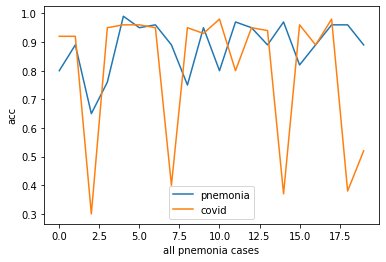

In [ ]:
plt.plot(allpnemoniadetected,label='pnemonia')
plt.plot(coviddetectedfromp,label='covid')
plt.xlabel('all pnemonia cases')
plt.ylabel('acc')
plt.legend()
plt.show()

### Collectively graph aboe shows that when we selected all the pnemonia cases likelihood of Covid-19 is more but model is not biased towards it

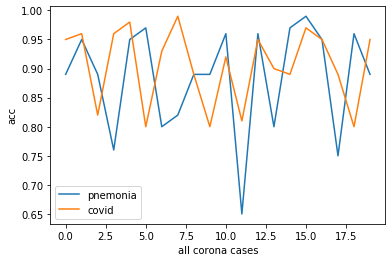

In [ ]:
plt.plot(pnemoniadetected,label='pnemonia')
plt.plot(allcoviddetected,label='covid')
plt.xlabel('all corona cases')
plt.ylabel('acc')
plt.legend()
plt.show()

### However when all corona postive cases selected there is relatively high possiblity of having Pnemonia 

#### Short conclusion of Deep learning detection of model : Models are not biased towards picking up only one of the pnemonia or covid-19
#### However, one thing concluded that as per model Covid-19 case is more likely to have pnemonia as well if model training is correct